In [2]:
import numpy as np 
import pandas as pd 
import matplotlib as plt

In [3]:
def significant_corr(df1,df2,a,b):
  import scipy.stats as stats
  if df2.empty:
    df2=df1
  r = stats.pearsonr(df1[a], df2[b])
  if r[1] < 0.1:
    return (True,r[0])
  else:
    return (False,0)

def print_significant_corr(df1,df2,a,b):
  import scipy.stats as stats
  if df2.empty:
    df2=df1
  r = stats.pearsonr(df1[a], df2[b])
  if r[1] < 0.1:
    print(f'Correlation between:  ' + a + '   and   ' + b)
    print('**********************************************')
    print(f'Pearson Correlation: {r[0]}, p-value: {r[1]}')
    print('*Statistically significant*')
    print('***********************************************')

In [5]:
ieco_grf_df=pd.read_csv('Kevin/iEco_&_graph.csv')
ieco_df=pd.read_csv('Kevin/iEco.csv')
ieco_df_copy=pd.read_csv('Kevin/iEco(copy).csv')
grf_df=pd.read_csv('Tidy_DataFrame.csv')
grf_sin_islas_nd=pd.read_csv('Gephi_sin_islas/CABA sin islas nodes.csv')
full_ieco_df=pd.read_csv('Kevin/full_iEco.csv')

ieco_grf_df=pd.concat([ieco_grf_df,grf_df],axis=1)
ieco_grf_df = ieco_grf_df.loc[:,~ieco_grf_df.columns.duplicated()]
full_ieco_df=full_ieco_df.rename({0:1,1:0,5:3,3:5},axis='index')
full_ieco_grf_df=pd.concat([full_ieco_df,grf_df],axis=1)


In [4]:
ieco_df

,Unnamed: 0,1 Foundational Institutions,2.01 I-Human Capital,2.02 I-Funding,2.03 I-Infrastructure,2.04 I-Demand,2.05 I-Culture & Incentives,3.01 E-Human Capital,3.02 E-Funding,3.03 E-Infrastructure,3.04 E-Demand,3.05 E-Culture & Incentives,4 Comparative Advantage,5 Impact
0,1,3.522,2.278000,1.5600,3.3175,3.110000,2.515,3.115,2.300000,3.6275,3.430,3.233333,2.93,1.985455
1,0,3.169,2.034667,1.7400,3.3100,2.716667,1.795,3.075,1.723333,3.7125,3.175,2.611667,2.58,2.094545
2,2,3.913,2.580667,1.2025,3.6925,2.960000,1.955,4.155,2.206667,3.9975,3.205,4.121667,3.11,2.375455
3,5,3.177,1.828000,1.8400,3.2650,2.876667,2.755,2.975,1.991667,3.6775,3.460,3.228333,2.74,2.088182
4,4,3.929,2.992000,1.9500,3.9525,3.076667,3.830,3.190,2.423333,4.2925,3.365,2.910000,2.84,2.270000
5,3,3.780,2.171333,1.5025,3.6150,2.570000,1.245,3.045,2.005000,3.9050,2.740,2.613333,2.48,2.257879


In [5]:
ieco_df_copy

,Unnamed: 0,1 Foundational Institutions,2.01 I-Human Capital,2.02 I-Funding,2.03 I-Infrastructure,2.04 I-Demand,2.05 I-Culture & Incentives,3.01 E-Human Capital,3.02 E-Funding,3.03 E-Infrastructure,3.04 E-Demand,3.05 E-Culture & Incentives,4 Comparative Advantage,5 Impact
0,México,3.522,2.278000,1.5600,3.3175,3.110000,2.515,3.115,2.300000,3.6275,3.430,3.233333,2.93,1.985455
1,Argentina,3.169,2.034667,1.7400,3.3100,2.716667,1.795,3.075,1.723333,3.7125,3.175,2.611667,2.58,2.094545
2,Chile,3.913,2.580667,1.2025,3.6925,2.960000,1.955,4.155,2.206667,3.9975,3.205,4.121667,3.11,2.375455
3,Brasil,3.177,1.828000,1.8400,3.2650,2.876667,2.755,2.975,1.991667,3.6775,3.460,3.228333,2.74,2.088182
4,España,3.929,2.992000,1.9500,3.9525,3.076667,3.830,3.190,2.423333,4.2925,3.365,2.910000,2.84,2.270000
5,Uruguay,3.780,2.171333,1.5025,3.6150,2.570000,1.245,3.045,2.005000,3.9050,2.740,2.613333,2.48,2.257879


In [6]:
grf_df

,Ciudad,País,avg strength,weight,Degree,Weighted Degree,Eccentricidad,Clustering,Diámetro,Radio,Camino más corto promedio,Transitividad,Eficiencia Global,Small Worldness,Rich Club Coefficient,Core Ratio,Central Point Dominance,Spectral radius
0,CABA,Argentina,3.244633,1.481579,4.385965,14.017544,4.798246,0.148791,6,3,3.355669,0.107392,0.325773,0.960807,5.333333,0.495614,0.251,1.868
1,CDMX,México,3.477388,1.388629,3.658863,12.963211,5.622074,0.075940,7,4,3.820318,0.050000,0.289320,0.677149,1.000000,0.421405,0.202,1.910
2,Santiago de Chile,Chile,3.417211,1.462564,3.948718,13.764103,5.041026,0.134037,6,3,3.227544,0.100744,0.338889,0.906814,19.000000,0.430769,0.525,1.890
3,Montevideo,Uruguay,3.227742,2.749495,7.747475,25.939394,4.479798,0.207747,6,3,3.081116,0.224523,0.360837,1.274519,59.000000,0.565657,0.179,1.778
4,Madrid,España,3.518387,1.362343,3.790795,12.861925,6.079498,0.120510,8,5,3.783517,0.081917,0.294653,1.141033,14.000000,0.439331,0.184,1.920
5,Sao Paulo,Brasil,3.430669,1.253704,3.370370,11.694444,6.726852,0.129928,8,4,4.324031,0.078571,0.266719,1.211794,1.000000,0.421296,0.237,1.983


In [12]:
ieco_grf_df

,Unnamed: 0,1 Foundational Institutions,2.01 I-Human Capital,2.02 I-Funding,2.03 I-Infrastructure,2.04 I-Demand,2.05 I-Culture & Incentives,3.01 E-Human Capital,3.02 E-Funding,3.03 E-Infrastructure,...,Diámetro,Radio,Camino más corto promedio,Transitividad,Eficiencia Global,Small Worldness,Core Ratio,Rich Club Coefficient,Central Point Dominance,Spectral radius
0,0,3.169,2.034667,1.7400,3.3100,2.716667,1.795,3.075,1.723333,3.7125,...,6,3,3.355669,0.107392,0.325773,0.960807,0.495614,5.333333,0.251,1.868
1,1,3.522,2.278000,1.5600,3.3175,3.110000,2.515,3.115,2.300000,3.6275,...,7,4,3.820318,0.050000,0.289320,0.677149,0.421405,1.000000,0.202,1.910
2,2,3.913,2.580667,1.2025,3.6925,2.960000,1.955,4.155,2.206667,3.9975,...,6,3,3.227544,0.100744,0.338889,0.906814,0.430769,19.000000,0.525,1.890
3,3,3.780,2.171333,1.5025,3.6150,2.570000,1.245,3.045,2.005000,3.9050,...,6,3,3.081116,0.224523,0.360837,1.274519,0.565657,59.000000,0.179,1.778
4,4,3.929,2.992000,1.9500,3.9525,3.076667,3.830,3.190,2.423333,4.2925,...,8,5,3.783517,0.081917,0.294653,1.141033,0.439331,14.000000,0.184,1.920
5,5,3.177,1.828000,1.8400,3.2650,2.876667,2.755,2.975,1.991667,3.6775,...,8,4,4.324031,0.078571,0.266719,1.211794,0.421296,1.000000,0.237,1.983


In [8]:
full_ieco_df

,Unnamed: 0,1.01 Ease of doing business (WB),1.02 Starting a business (WB),1.03 Paying taxes (WB),1.04 Resolving Insolvency (WB),1.05 Enforcing contracts (WB),1.06 Property Rights (IEF),1.07 Government Integrity (IEF),1.08 Labor Freedom (IEF),1.09 Trade freedom (IEF),...,5.02 Social Progress Index,5.03 Inclusive Development Index,5.04 Population below international poverty line (SDG 1 - No poverty),5.05 Prevalence of undernourishment (SDG 2 - Zero Hunger),5.06 Annual growth rate of real GDP per capita (SDG 8 - Decent Jobs and Economic Growth),5.07 Unemployment rate of population 15 years of age and older (SDG 8 - Decent Jobs and Economic Growth),"5.08 Carbon dioxide emissions per unit of GDP (SDG 9 - Industry, Innovation and Infrastructure)",5.09 Proportion of urban population living in slums (SDG 11 - Sustainable Cities and Communities),5.10 Annual population-weighted average mean concentration of fine suspended particles of less than 2.5 microns in diameter (SDG 11 - Sustainable Cities and Communities),5.11 Domestic material consumption per capita (SDG 12 - Responsible Consumption and Production)
1,México,3.90,4.44,3.63,3.81,3.68,3.33,2.47,3.34,4.50,...,3.82,3.08,4.80,4.88,3.34,4.72,4.33,4.520000,4.32,1.71
0,Argentina,3.36,4.22,2.97,2.60,3.30,3.02,2.99,2.86,3.77,...,4.07,3.09,4.97,4.88,3.58,3.94,4.20,4.580000,4.71,2.03
2,Chile,3.90,4.66,4.01,3.40,3.59,3.80,3.94,3.59,4.56,...,4.20,3.29,4.94,4.93,3.32,4.16,4.29,4.840000,4.28,5.00
5,Brasil,3.36,4.25,2.38,3.02,3.56,3.29,2.82,2.98,3.71,...,3.91,2.95,4.61,5.00,3.22,3.26,4.60,4.510000,4.73,2.18
4,España,4.12,4.48,4.39,4.17,3.84,4.00,3.20,3.31,4.46,...,4.50,3.27,4.92,5.00,3.82,2.57,4.56,4.900000,4.82,1.68
3,Uruguay,3.46,4.58,3.81,3.14,3.25,3.88,3.94,3.84,4.10,...,4.11,3.31,4.99,5.00,3.67,4.02,4.87,4.643333,4.87,4.32


In [13]:
list1=list(ieco_df.keys())
list2=list(grf_df.keys())

list1.remove('Unnamed: 0')
list2.remove('Ciudad')
list2.remove('País')

positive_pairs=[]
negative_pairs=[]

for key1 in list1:
    for key2 in list2:
        sig,corr=significant_corr(ieco_grf_df,ieco_grf_df,key1,key2)
        if sig==True:
            if corr>0:
                positive_pairs.append((key1,key2))
            else:
                negative_pairs.append((key1,key2))

In [14]:
for keys in positive_pairs:
    print_significant_corr(ieco_grf_df,ieco_grf_df,keys[0],keys[1])

Correlation between:  2.02 I-Funding   and   Diámetro
**********************************************
Pearson Correlation: 0.7385065695777545, p-value: 0.09362791589032411
*Statistically significant*
***********************************************
Correlation between:  2.04 I-Demand   and   avg strength
**********************************************
Pearson Correlation: 0.952116314101418, p-value: 0.00338437607108655
*Statistically significant*
***********************************************
Correlation between:  2.05 I-Culture & Incentives   and   avg strength
**********************************************
Pearson Correlation: 0.857666917638727, p-value: 0.028946317443073532
*Statistically significant*
***********************************************
Correlation between:  2.05 I-Culture & Incentives   and   Eccentricidad
**********************************************
Pearson Correlation: 0.8042285278880068, p-value: 0.05373808928218263
*Statistically significant*
***********************

In [15]:
for keys in negative_pairs:
    print_significant_corr(ieco_grf_df,ieco_grf_df,keys[0],keys[1])

Correlation between:  2.04 I-Demand   and   weight
**********************************************
Pearson Correlation: -0.7513026741395321, p-value: 0.08508453028112797
*Statistically significant*
***********************************************
Correlation between:  2.04 I-Demand   and   Degree
**********************************************
Pearson Correlation: -0.7930354359599853, p-value: 0.059818901855709296
*Statistically significant*
***********************************************
Correlation between:  2.04 I-Demand   and   Weighted Degree
**********************************************
Pearson Correlation: -0.7540324234088824, p-value: 0.0833095479157745
*Statistically significant*
***********************************************
Correlation between:  2.04 I-Demand   and   Clustering
**********************************************
Pearson Correlation: -0.9174944429171862, p-value: 0.00992993587365419
*Statistically significant*
***********************************************
Correla

In [16]:
#list1=list(full_ieco_df.keys())
list1=['2.04a Government procurement of advanced technology (GCI)','2.04b University-industry research collaborations (GII)','2.04c Trade, Competition & Market scale (GII)','3.04a Buyer sophistication (GCI 4.0)','3.04b Domestic Market Scale (GII)']
list2=list(grf_df.keys())

list2.remove('Ciudad')
list2.remove('País')

positive_pairs_2=[]
negative_pairs_2=[]

for key1 in list1:
    for key2 in list2:
        sig,corr=significant_corr(full_ieco_grf_df,full_ieco_grf_df,key1,key2)
        if sig==True:
            if corr>0:
                positive_pairs_2.append((key1,key2))
            else:
                negative_pairs_2.append((key1,key2))

In [17]:
for keys in positive_pairs_2:
    print_significant_corr(full_ieco_grf_df,full_ieco_grf_df,keys[0],keys[1])

Correlation between:  2.04b University-industry research collaborations (GII)   and   avg strength
**********************************************
Pearson Correlation: 0.9057240787070973, p-value: 0.012912964197428016
*Statistically significant*
***********************************************
Correlation between:  2.04b University-industry research collaborations (GII)   and   Spectral radius
**********************************************
Pearson Correlation: 0.7928267560324674, p-value: 0.059935113706115976
*Statistically significant*
***********************************************
Correlation between:  2.04c Trade, Competition & Market scale (GII)   and   avg strength
**********************************************
Pearson Correlation: 0.9567036039358547, p-value: 0.0027712856343463715
*Statistically significant*
***********************************************
Correlation between:  2.04c Trade, Competition & Market scale (GII)   and   Spectral radius
***********************************

In [18]:
for keys in negative_pairs_2:
    print_significant_corr(full_ieco_grf_df,full_ieco_grf_df,keys[0],keys[1])

Correlation between:  2.04b University-industry research collaborations (GII)   and   weight
**********************************************
Pearson Correlation: -0.8026827654539166, p-value: 0.05455995298570256
*Statistically significant*
***********************************************
Correlation between:  2.04b University-industry research collaborations (GII)   and   Degree
**********************************************
Pearson Correlation: -0.8537047923796843, p-value: 0.03053790559238056
*Statistically significant*
***********************************************
Correlation between:  2.04b University-industry research collaborations (GII)   and   Weighted Degree
**********************************************
Pearson Correlation: -0.8072291739267888, p-value: 0.05215914812809959
*Statistically significant*
***********************************************
Correlation between:  2.04b University-industry research collaborations (GII)   and   Clustering
*********************************

In [19]:
list1=list(full_ieco_df.keys())[-9:]
list2=list(grf_df.keys())

list2.remove('Ciudad')
list2.remove('País')

positive_pairs_3=[]
negative_pairs_3=[]

for key1 in list1:
    for key2 in list2:
        sig,corr=significant_corr(full_ieco_grf_df,full_ieco_grf_df,key1,key2)
        if sig==True:
            if corr>0:
                positive_pairs_3.append((key1,key2))
            else:
                negative_pairs_3.append((key1,key2))

In [20]:
for keys in positive_pairs_3:
    print_significant_corr(full_ieco_grf_df,full_ieco_grf_df,keys[0],keys[1])

Correlation between:  5.03 Inclusive Development Index   and   Eficiencia Global
**********************************************
Pearson Correlation: 0.7507052737497485, p-value: 0.08547522386457787
*Statistically significant*
***********************************************
Correlation between:  5.04 Population below international poverty line (SDG 1 - No poverty)   and   Eficiencia Global
**********************************************
Pearson Correlation: 0.8524436013503677, p-value: 0.031052971497648834
*Statistically significant*
***********************************************
Correlation between:  5.05 Prevalence of undernourishment (SDG 2 - Zero Hunger)   and   Small Worldness
**********************************************
Pearson Correlation: 0.8859378118403944, p-value: 0.0187732891942125
*Statistically significant*
***********************************************
Correlation between:  5.08 Carbon dioxide emissions per unit of GDP (SDG 9 - Industry, Innovation and Infrastructure) 

In [21]:
for keys in negative_pairs_3:
    print_significant_corr(full_ieco_grf_df,full_ieco_grf_df,keys[0],keys[1])

Correlation between:  5.03 Inclusive Development Index   and   Camino más corto promedio
**********************************************
Pearson Correlation: -0.7636868379565527, p-value: 0.07716754029040038
*Statistically significant*
***********************************************
Correlation between:  5.04 Population below international poverty line (SDG 1 - No poverty)   and   Eccentricidad
**********************************************
Pearson Correlation: -0.8546314717467908, p-value: 0.0301620489856016
*Statistically significant*
***********************************************
Correlation between:  5.04 Population below international poverty line (SDG 1 - No poverty)   and   Camino más corto promedio
**********************************************
Pearson Correlation: -0.9180526220966121, p-value: 0.009797905523802828
*Statistically significant*
***********************************************
Correlation between:  5.04 Population below international poverty line (SDG 1 - No povert

In [8]:
from sklearn.linear_model import LinearRegression
from scipy import stats
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

def lin_reg_p_val(reg,X,y):
    sse = np.sum((reg.predict(X) - y) ** 2, axis=0) / float(X.shape[0] - X.shape[1])
    if isinstance(sse, float):
        se = np.array([np.sqrt(np.diagonal(sse * np.linalg.inv(np.dot(X.T, X))))])
    else:
        se = np.array([np.sqrt(np.diagonal(sse[i] * np.linalg.inv(np.dot(X.T, X)))) for i in range(sse.shape[0])])
    t = reg.coef_ / se
    p = 2 * (1 - stats.t.cdf(np.abs(t), y.shape[0] - X.shape[1]))
    return p

def plot_linear_model(reg,X,y,key1,key2,predict):
    ax=plt.axes(projection='3d')
    a = np.linspace(1, 5, 30)
    b = np.linspace(1, 5, 30)
    A,B=np.meshgrid(a,b)
    C=A*reg.coef_[0]+B*reg.coef_[1]+reg.intercept_
    ax.scatter3D(X[:,0],X[:,1],y,cmap='Greens')
    ax.contour3D(A,B,C,50,cmap='binary')
    ax.set_title('Linear Model')
    ax.set_xlabel(key1)
    ax.set_ylabel(key2)
    ax.set_zlabel(predict)
    plt.show()

In [42]:
''' 
4d linear model
Has to many responses and is likely not useful. 
Didn't try higher dimensions because it was likely to happen the same (any n+1 points are in an n-plane)
'''

ieco_key_list=list(ieco_df.keys())
ieco_key_list.remove('Unnamed: 0')
ieco_key_list.remove('4 Comparative Advantage')
ieco_key_list.remove('5 Impact')

ieco_key_predictors=['4 Comparative Advantage','5 Impact']

grf_key_list=list(grf_df.keys())
grf_key_list.remove('Ciudad')
grf_key_list.remove('País')

for key1 in ieco_key_list:
    for key2 in ieco_key_list:
        if key1 != key2:
            for key3 in ieco_key_list:
                if key3 !=key1 and key3 !=key2:
                    for predict in ieco_key_predictors:
                        X=np.concatenate([ieco_df[key1].to_numpy(),ieco_df[key2].to_numpy(),ieco_df[key3].to_numpy()],axis=0)
                        X=X.reshape(6,3)
                        y=ieco_df[predict].to_numpy()
                        reg=LinearRegression().fit(X,y)
                        p=lin_reg_p_val(reg,X,y)
                        if p[0][0]<.05 and p[0][1]<.05 and p[0][2]<.05 and reg.score(X,y)>.9:
                            print(key1,key2,key3,predict)
                            print('Regression Score: ' + str(reg.score(X,y)) + ' p-value: ' + str(p) )
                            print('Regression Coefficients: ' + str(reg.coef_) )


ive Advantage
Regression Score: 0.9736508460833928 p-value: [[0.01564235 0.00251907 0.02991406]]
Regression Coefficients: [ 0.31166467 -0.43242413  0.15509674]
2.04 I-Demand 3.05 E-Culture & Incentives 3.02 E-Funding 4 Comparative Advantage
Regression Score: 0.9759741646533872 p-value: [[0.02781788 0.00661835 0.03268494]]
Regression Coefficients: [ 0.30281228 -0.36193001  0.16353497]
2.05 I-Culture & Incentives 1 Foundational Institutions 3.02 E-Funding 4 Comparative Advantage
Regression Score: 0.9990623354943423 p-value: [[8.91642716e-06 2.57698433e-05 3.27551454e-02]]
Regression Coefficients: [ 0.5562018  -0.24821707 -0.02058889]
2.05 I-Culture & Incentives 2.04 I-Demand 2.03 I-Infrastructure 4 Comparative Advantage
Regression Score: 0.9791615135259965 p-value: [[5.86607370e-05 5.22894660e-04 1.04793568e-03]]
Regression Coefficients: [ 1.58879535 -0.49141533 -0.35849021]
2.05 I-Culture & Incentives 2.04 I-Demand 2.03 I-Infrastructure 5 Impact
Regression Score: 0.9099034728148969 p-va

1 Foundational Institutions 2.02 I-Funding 4 Comparative Advantage
Regression Score: 0.8760073249285922 p-value: [[0.01343502 0.00319696]]
Regression Coefficients: [-0.36795922  0.59844681] Intercept: 2.2490030178275653


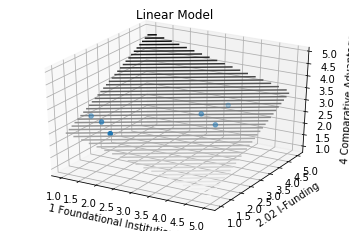

1 Foundational Institutions 2.04 I-Demand 4 Comparative Advantage
Regression Score: 0.9034882009953756 p-value: [[0.014796   0.00461447]]
Regression Coefficients: [-0.57197353  0.89280334] Intercept: 2.013796759131127


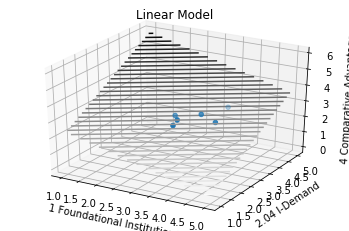

2.01 I-Human Capital 2.03 I-Infrastructure 5 Impact
Regression Score: 0.8193705182262774 p-value: [[0.00335405 0.02322692]]
Regression Coefficients: [ 0.49829976 -0.325828  ] Intercept: 1.4971920429393188


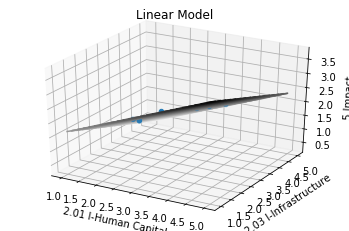

2.01 I-Human Capital 2.05 I-Culture & Incentives 5 Impact
Regression Score: 0.9207897687672382 p-value: [[2.65906882e-05 4.05732704e-05]]
Regression Coefficients: [0.35862972 0.43941448] Intercept: 0.34692869151073813


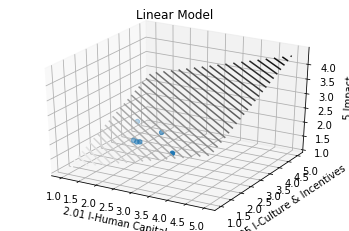

2.02 I-Funding 1 Foundational Institutions 4 Comparative Advantage
Regression Score: 0.948857421438137 p-value: [[0.00217455 0.00049082]]
Regression Coefficients: [ 0.39246891 -0.6292434 ] Intercept: 3.323386968946955


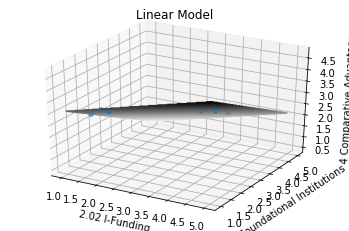

2.04 I-Demand 1 Foundational Institutions 4 Comparative Advantage
Regression Score: 0.8743609182517296 p-value: [[0.03125506 0.00856859]]
Regression Coefficients: [ 0.51736144 -0.85666311] Intercept: 3.622728188256655


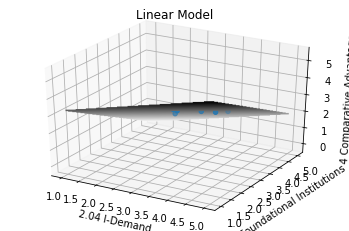

2.05 I-Culture & Incentives 1 Foundational Institutions 4 Comparative Advantage
Regression Score: 0.8768570972508145 p-value: [[0.03003925 0.00433588]]
Regression Coefficients: [ 0.10780147 -0.22947497] Intercept: 3.035610495544171


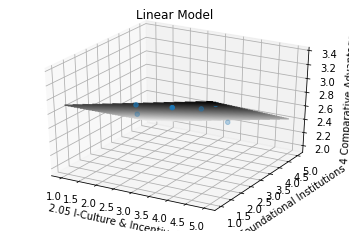

2.05 I-Culture & Incentives 2.01 I-Human Capital 4 Comparative Advantage
Regression Score: 0.8044104098362947 p-value: [[0.02019329 0.00055172]]
Regression Coefficients: [-0.15378054 -0.56369693] Intercept: 4.305271534557415


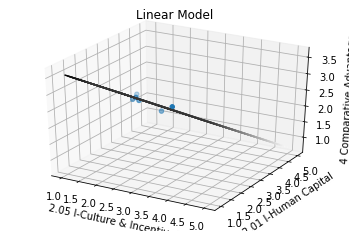

2.05 I-Culture & Incentives 3.01 E-Human Capital 4 Comparative Advantage
Regression Score: 0.8155081056707557 p-value: [[0.04675269 0.00810444]]
Regression Coefficients: [ 0.10982991 -0.23531627] Intercept: 3.0205750153785753


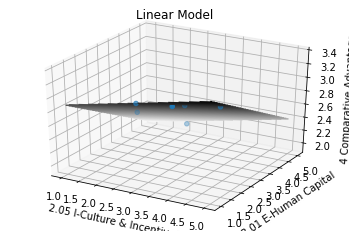

3.01 E-Human Capital 2.02 I-Funding 4 Comparative Advantage
Regression Score: 0.8811180405504192 p-value: [[0.00933919 0.00140927]]
Regression Coefficients: [-0.31499457  0.58705617] Intercept: 2.189377714659


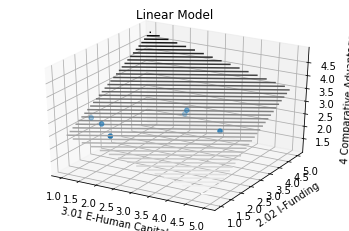

3.01 E-Human Capital 2.03 I-Infrastructure 4 Comparative Advantage
Regression Score: 0.8098278471485052 p-value: [[0.02516929 0.04466569]]
Regression Coefficients: [-0.3951867  -0.36480113] Intercept: 5.363512809571261


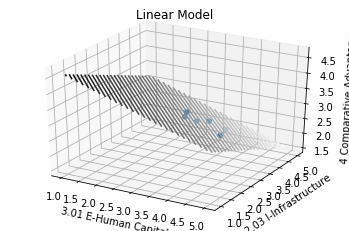

3.01 E-Human Capital 2.04 I-Demand 4 Comparative Advantage
Regression Score: 0.8599935971542845 p-value: [[0.03188059 0.00079607]]
Regression Coefficients: [-0.32271692  1.0419281 ] Intercept: 0.8375767719990788


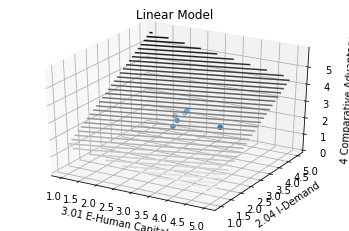

3.02 E-Funding 5 Impact 5 Impact
Regression Score: 0.8123852467669956 p-value: [[0.00502286 0.01126711]]
Regression Coefficients: [0.65391718 0.57945144] Intercept: -0.47377949273630815


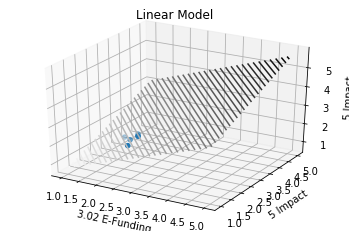

3.04 E-Demand 4 Comparative Advantage 4 Comparative Advantage
Regression Score: 0.908953926185887 p-value: [[0.00036386 0.01673813]]
Regression Coefficients: [ 1.21672152 -0.47075416] Intercept: 0.29891673895403104


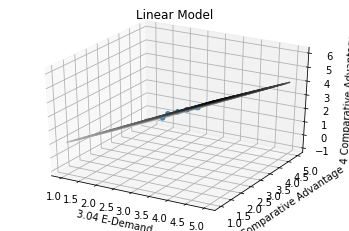

In [10]:
'''
3D linear model for predicting impact and comparative advantage from iEcosystem metrics
'''

for key1 in ieco_key_list:
    for key2 in ieco_key_list:
        if key1 != key2:
            for predict in ieco_key_predictors:
                X=np.concatenate([ieco_df[key1].to_numpy(),ieco_df[key2].to_numpy()],axis=0)
                X=X.reshape(6,2)
                y=ieco_df[predict].to_numpy()
                reg=LinearRegression().fit(X,y)
                p=lin_reg_p_val(reg,X,y)
                if p[0][0]<.05 and p[0][1]<.05 and reg.score(X,y)>.8:
                    print(key1,key2,predict)
                    print('Regression Score: ' + str(reg.score(X,y)) + ' p-value: ' + str(p) )
                    print('Regression Coefficients: ' + str(reg.coef_) + ' Intercept: ' + str(reg.intercept_))
                    plot_linear_model(reg,X,y,key1,key2,predict)

avg strength Camino más corto promedio 4 Comparative Advantage
Regression Score: 0.9393750026349913 p-value: [[8.32950982e-05 1.14135421e-03]]
Regression Coefficients: [ 1.52093491 -0.74359955] Intercept: 0.21893941946236772


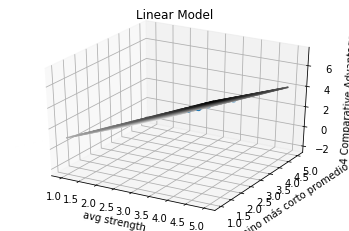

Diámetro avg strength 4 Comparative Advantage
Regression Score: 0.9333420217897805 p-value: [[0.00248634 0.00488787]]
Regression Coefficients: [ 0.49273697 -0.39561523] Intercept: 2.3544801242489104


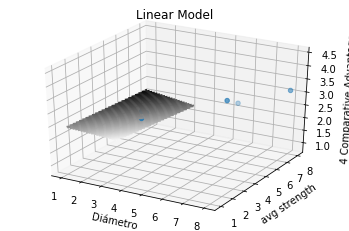

Diámetro Eccentricidad 4 Comparative Advantage
Regression Score: 0.9691360868237914 p-value: [[0.00037699 0.00161184]]
Regression Coefficients: [ 0.38842425 -0.25257799] Intercept: 2.047163654488883


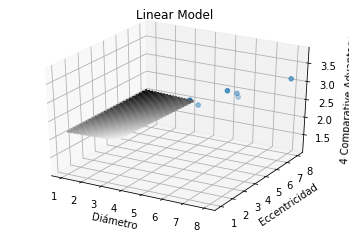

Diámetro Camino más corto promedio 4 Comparative Advantage
Regression Score: 0.8691906367850936 p-value: [[0.01055552 0.01580778]]
Regression Coefficients: [ 0.4372618  -0.36763998] Intercept: 2.5415264205215524


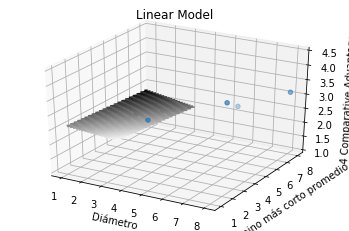

Diámetro Central Point Dominance 4 Comparative Advantage
Regression Score: 0.8043377712798182 p-value: [[0.02429693 0.03252261]]
Regression Coefficients: [ 0.44977648 -0.39171703] Intercept: 2.620137277885829


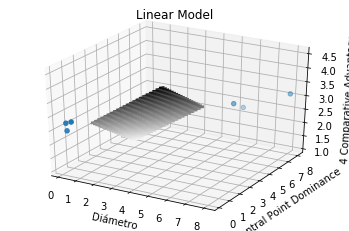

Radio Eccentricidad 4 Comparative Advantage
Regression Score: 0.8121955178853725 p-value: [[0.01883018 0.01292411]]
Regression Coefficients: [ 0.2421795  -0.26156247] Intercept: 2.906629246708233


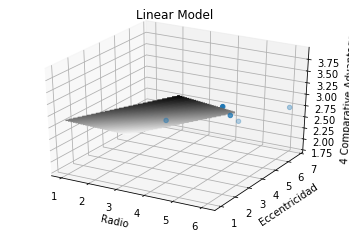

Radio Diámetro 4 Comparative Advantage
Regression Score: 0.9860169369265395 p-value: [[1.19937308e-04 6.81998895e-05]]
Regression Coefficients: [ 0.27365385 -0.30644231] Intercept: 3.000480769230769


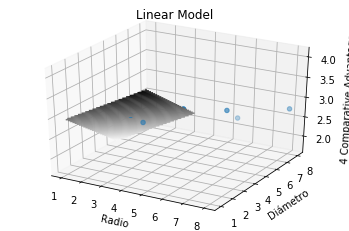

In [9]:
'''
3D linear models for predicting impact and comparative advantage using grph metrics
'''

grf_key_list=list(grf_df.keys())
grf_key_list.remove('Ciudad')
grf_key_list.remove('País')

ieco_key_predictors=['4 Comparative Advantage','5 Impact']

for key1 in grf_key_list:
    for key2 in grf_key_list:
        if key1 != key2:
            for predict in ieco_key_predictors:
                X=np.concatenate([ieco_grf_df[key1].to_numpy(),ieco_grf_df[key2].to_numpy()],axis=0)
                X=X.reshape(6,2)
                y=ieco_grf_df[predict].to_numpy()
                reg=LinearRegression().fit(X,y)
                p=lin_reg_p_val(reg,X,y)
                if p[0][0]<.05 and p[0][1]<.05 and reg.score(X,y)>.8:
                    print(key1,key2,predict)
                    print('Regression Score: ' + str(reg.score(X,y)) + ' p-value: ' + str(p) )
                    print('Regression Coefficients: ' + str(reg.coef_) + ' Intercept: ' + str(reg.intercept_))
                    plot_linear_model(reg,X,y,key1,key2,predict)

avg strength Eccentricidad 2.05 I-Culture & Incentives
Regression Score: 0.9302262148521523 p-value: [[0.00081358 0.00222163]]
Regression Coefficients: [ 2.20786293 -1.62079637] Intercept: 0.02933092506528867


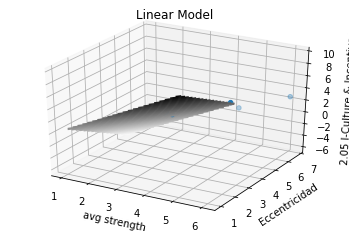

avg strength Diámetro 3.04 E-Demand
Regression Score: 0.9432260255893233 p-value: [[0.00109706 0.00122142]]
Regression Coefficients: [ 0.65147448 -0.61106662] Intercept: 3.1232328786086834


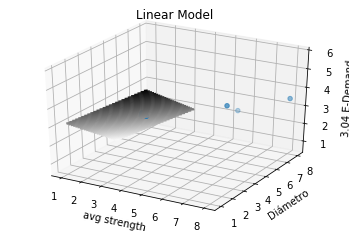

avg strength Radio 2.04 I-Demand
Regression Score: 0.8655839372781196 p-value: [[0.03965733 0.00077866]]
Regression Coefficients: [ 0.17878093 -0.55464577] Intercept: 4.20770999592363


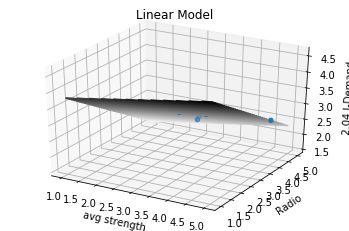

avg strength Radio 3.04 E-Demand
Regression Score: 0.9731226329495432 p-value: [[4.38928253e-04 4.89870260e-05]]
Regression Coefficients: [ 0.35934101 -0.63726721] Intercept: 4.205537651640551


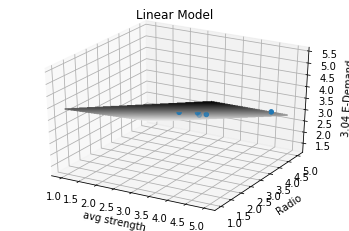

avg strength Camino más corto promedio 2.04 I-Demand
Regression Score: 0.8380743663050423 p-value: [[0.00106521 0.00769456]]
Regression Coefficients: [ 1.17627357 -0.6595181 ] Intercept: 1.2048822531184769


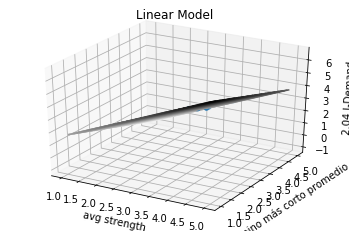

avg strength Camino más corto promedio 4 Comparative Advantage
Regression Score: 0.9393750026349913 p-value: [[8.32950982e-05 1.14135421e-03]]
Regression Coefficients: [ 1.52093491 -0.74359955] Intercept: 0.21893941946236772


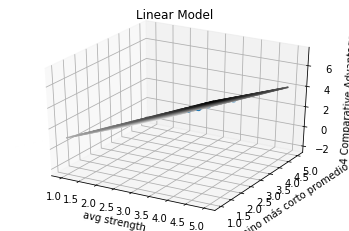

avg strength Rich Club Coefficient 2.01 I-Human Capital
Regression Score: 0.8201518366777575 p-value: [[0.04318305 0.01338362]]
Regression Coefficients: [-0.0382179   0.02322675] Intercept: 2.3477499044847


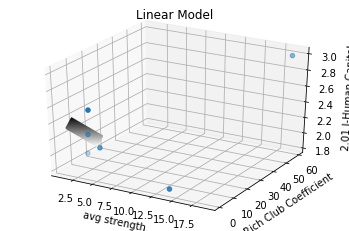

avg strength Central Point Dominance 3.02 E-Funding
Regression Score: 0.9692733877302575 p-value: [[0.00025019 0.00027468]]
Regression Coefficients: [ 1.29178002 -1.2712979 ] Intercept: 1.9884257269932157


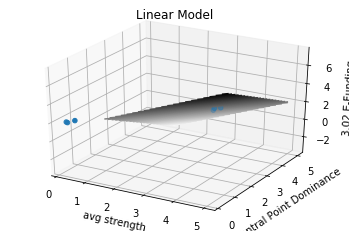

avg strength Spectral radius 3.02 E-Funding
Regression Score: 0.9300097297053016 p-value: [[0.00210443 0.00186227]]
Regression Coefficients: [ 1.55133869 -1.60811804] Intercept: 2.2446185446234352


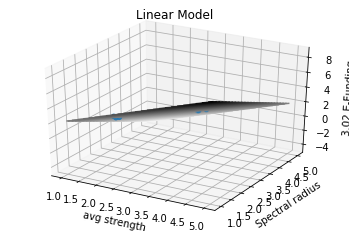

Degree Rich Club Coefficient 2.01 I-Human Capital
Regression Score: 0.8241096934417073 p-value: [[0.03969412 0.01272797]]
Regression Coefficients: [-0.03859753  0.02323973] Intercept: 2.345203596213873


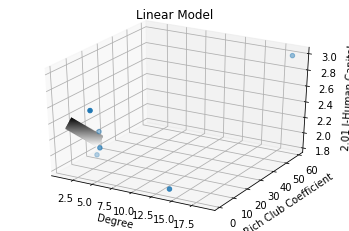

Eccentricidad Rich Club Coefficient 2.01 I-Human Capital
Regression Score: 0.8120508669022173 p-value: [[0.04466176 0.01447711]]
Regression Coefficients: [-0.03702772  0.02293152] Intercept: 2.3514612241264974


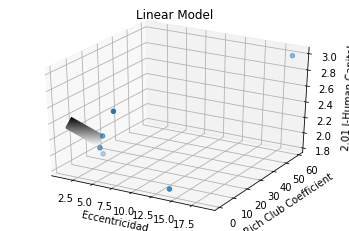

Clustering Diámetro 3.04 E-Demand
Regression Score: 0.8089347229538815 p-value: [[0.01531563 0.01461733]]
Regression Coefficients: [ 0.64091876 -0.62089525] Intercept: 3.265621613979516


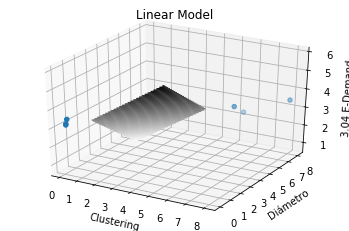

Clustering Transitividad 3.02 E-Funding
Regression Score: 0.8634711137193123 p-value: [[0.00820992 0.00760117]]
Regression Coefficients: [-3.65688675  3.0473907 ] Intercept: 2.1415305737000176


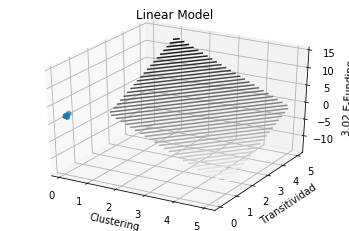

Clustering Eficiencia Global 3.02 E-Funding
Regression Score: 0.8773249143431788 p-value: [[0.01107025 0.00594668]]
Regression Coefficients: [-3.81226672  4.62352543] Intercept: 1.9488731222031204


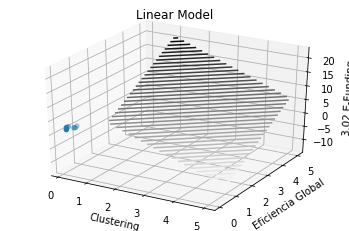

Clustering Small Worldness 2.04 I-Demand
Regression Score: 0.8178052592355679 p-value: [[0.0116777  0.01511456]]
Regression Coefficients: [-1.00439728  0.86192008] Intercept: 2.942306748285999


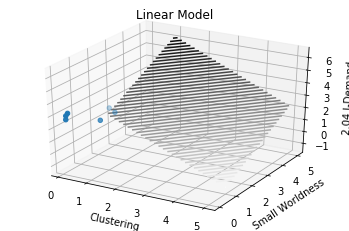

Clustering Small Worldness 2.05 I-Culture & Incentives
Regression Score: 0.9890897757000844 p-value: [[1.07554499e-04 5.36249076e-05]]
Regression Coefficients: [-3.6585244   4.04036285] Intercept: 2.0208610411945642


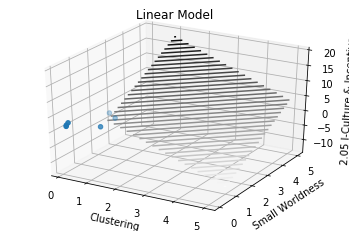

Clustering Core Ratio 2.04 I-Demand
Regression Score: 0.9196826022639024 p-value: [[0.00210629 0.003147  ]]
Regression Coefficients: [-2.64521461  2.27342213] Intercept: 2.974568130148397


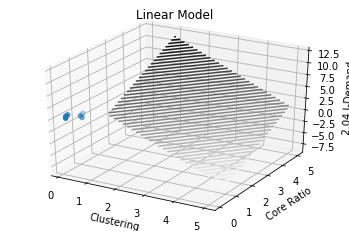

Clustering Core Ratio 3.02 E-Funding
Regression Score: 0.8385126288809474 p-value: [[0.01396195 0.01032225]]
Regression Coefficients: [-2.65868802  2.78021428] Intercept: 2.04798048486483


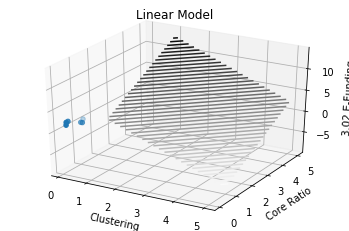

Diámetro avg strength 3.05 E-Culture & Incentives
Regression Score: 0.8923461574137455 p-value: [[0.00754016 0.01534162]]
Regression Coefficients: [ 1.12658919 -0.88431228] Intercept: 2.041896797071316


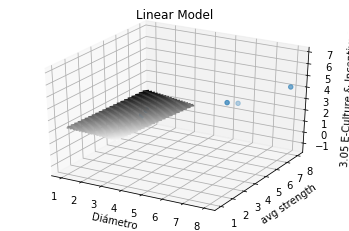

Diámetro avg strength 4 Comparative Advantage
Regression Score: 0.9333420217897805 p-value: [[0.00248634 0.00488787]]
Regression Coefficients: [ 0.49273697 -0.39561523] Intercept: 2.3544801242489104


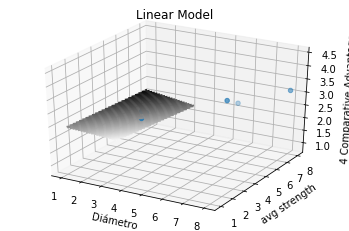

Diámetro Eccentricidad 3.02 E-Funding
Regression Score: 0.9188491869590036 p-value: [[0.00351823 0.00234569]]
Regression Coefficients: [ 0.38261154 -0.40493138] Intercept: 2.370850255184816


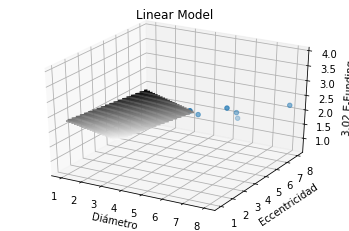

Diámetro Eccentricidad 4 Comparative Advantage
Regression Score: 0.9691360868237914 p-value: [[0.00037699 0.00161184]]
Regression Coefficients: [ 0.38842425 -0.25257799] Intercept: 2.047163654488883


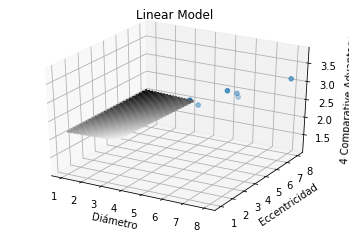

Diámetro Camino más corto promedio 3.02 E-Funding
Regression Score: 0.9846067855531724 p-value: [[1.03701691e-04 7.44997640e-05]]
Regression Coefficients: [ 0.55676912 -0.57331548] Intercept: 2.369683389683175


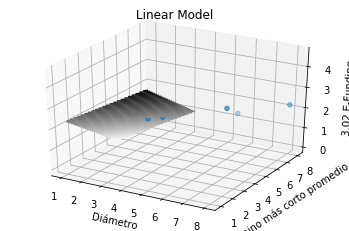

Diámetro Camino más corto promedio 4 Comparative Advantage
Regression Score: 0.8691906367850936 p-value: [[0.01055552 0.01580778]]
Regression Coefficients: [ 0.4372618  -0.36763998] Intercept: 2.5415264205215524


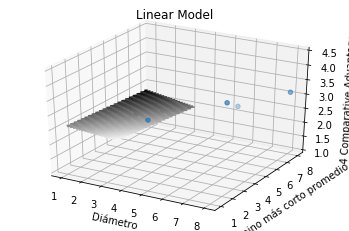

Diámetro Small Worldness 2.02 I-Funding
Regression Score: 0.8390637999005456 p-value: [[0.02334385 0.03340107]]
Regression Coefficients: [-0.4636508   0.39464788] Intercept: 1.8211535994516999


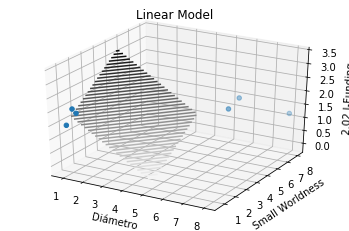

Diámetro Central Point Dominance 3.02 E-Funding
Regression Score: 0.8515342478596518 p-value: [[0.00834557 0.00842326]]
Regression Coefficients: [ 0.58842059 -0.56120833] Intercept: 2.074817686625571


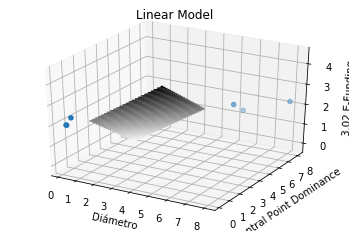

Diámetro Central Point Dominance 4 Comparative Advantage
Regression Score: 0.8043377712798182 p-value: [[0.02429693 0.03252261]]
Regression Coefficients: [ 0.44977648 -0.39171703] Intercept: 2.620137277885829


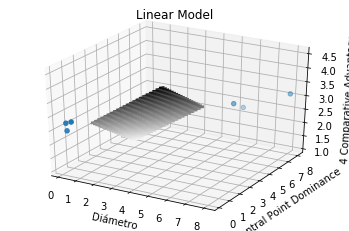

Radio avg strength 3.02 E-Funding
Regression Score: 0.8082960123946906 p-value: [[0.03973925 0.00200752]]
Regression Coefficients: [ 0.25621325 -0.62023792] Intercept: 3.388761334249816


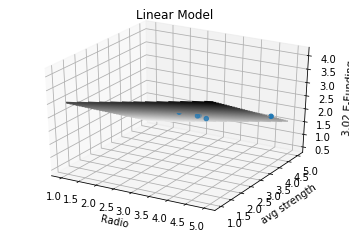

Radio weight 2.02 I-Funding
Regression Score: 0.8486857758871098 p-value: [[0.01168158 0.036645  ]]
Regression Coefficients: [-0.27662304  0.18866807] Intercept: 1.822752046141992


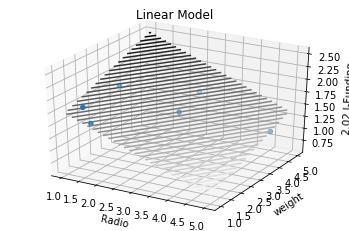

Radio Degree 2.03 I-Infrastructure
Regression Score: 0.9078086151967689 p-value: [[0.0029362  0.00705201]]
Regression Coefficients: [0.1737007  0.11686398] Intercept: 2.3538699469406783


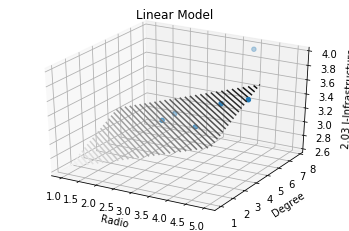

Radio Degree 3.03 E-Infrastructure
Regression Score: 0.9756662281058078 p-value: [[0.00037249 0.00039196]]
Regression Coefficients: [0.1407046  0.11890572] Intercept: 2.815606809417363


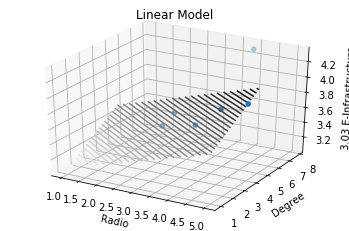

Radio Eccentricidad 4 Comparative Advantage
Regression Score: 0.8121955178853725 p-value: [[0.01883018 0.01292411]]
Regression Coefficients: [ 0.2421795  -0.26156247] Intercept: 2.906629246708233


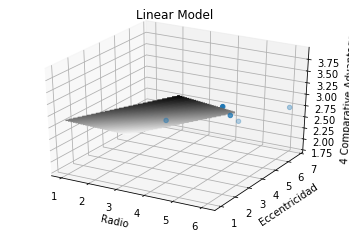

Radio Clustering 3.01 E-Human Capital
Regression Score: 0.8649443114674628 p-value: [[0.01444126 0.03550706]]
Regression Coefficients: [ 0.53268954 -0.41167809] Intercept: 3.0298827390522334


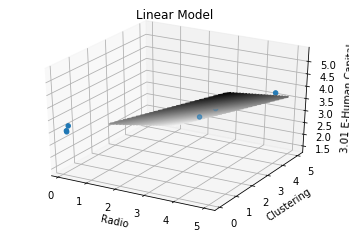

Radio Clustering 3.05 E-Culture & Incentives
Regression Score: 0.8570179743043989 p-value: [[0.01167947 0.02226137]]
Regression Coefficients: [ 0.73928111 -0.62343147] Intercept: 2.900611294901094


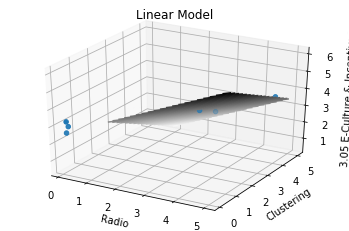

Radio Diámetro 3.05 E-Culture & Incentives
Regression Score: 0.9105426802346411 p-value: [[0.00358117 0.00283759]]
Regression Coefficients: [ 0.6978312 -0.7213515] Intercept: 3.361469017094017


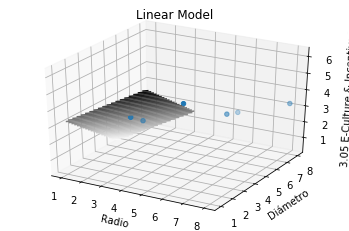

Radio Diámetro 4 Comparative Advantage
Regression Score: 0.9860169369265395 p-value: [[1.19937308e-04 6.81998895e-05]]
Regression Coefficients: [ 0.27365385 -0.30644231] Intercept: 3.000480769230769


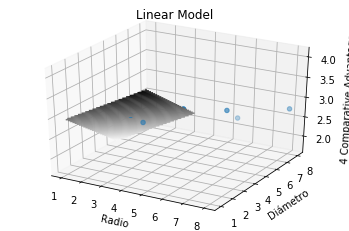

Radio Camino más corto promedio 3.02 E-Funding
Regression Score: 0.8564063216254716 p-value: [[0.03813989 0.00197343]]
Regression Coefficients: [ 0.21154015 -0.48527291] Intercept: 3.1525824758636563


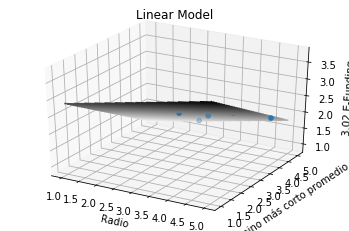

Radio Transitividad 3.01 E-Human Capital
Regression Score: 0.8566120790957024 p-value: [[0.01640341 0.039332  ]]
Regression Coefficients: [ 0.52732656 -0.4090395 ] Intercept: 3.040886680588172


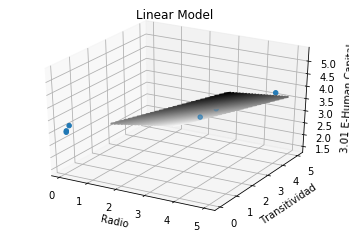

Radio Transitividad 3.05 E-Culture & Incentives
Regression Score: 0.8625778939685341 p-value: [[0.01071706 0.02002052]]
Regression Coefficients: [ 0.7416938  -0.63021941] Intercept: 2.9165854345329336


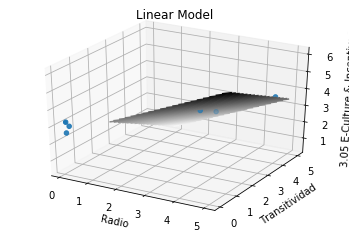

Radio Eficiencia Global 3.01 E-Human Capital
Regression Score: 0.875223601237751 p-value: [[0.01236813 0.03282342]]
Regression Coefficients: [ 0.53709772 -0.40703063] Intercept: 2.997035448359551


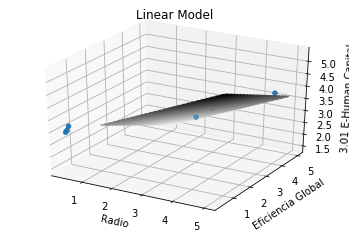

Radio Eficiencia Global 3.05 E-Culture & Incentives
Regression Score: 0.8770439762493971 p-value: [[0.00848354 0.01698045]]
Regression Coefficients: [ 0.753316  -0.6296199] Intercept: 2.868715356297577


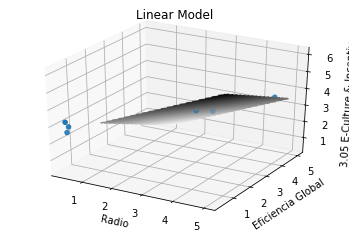

Radio Small Worldness 2.02 I-Funding
Regression Score: 0.838528926416838 p-value: [[0.0172699  0.04724313]]
Regression Coefficients: [-0.31828716  0.23387655] Intercept: 1.823545469925383


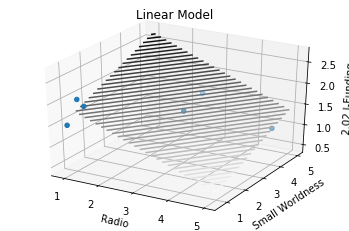

Radio Core Ratio 3.01 E-Human Capital
Regression Score: 0.8592737451402788 p-value: [[0.016111   0.04344492]]
Regression Coefficients: [ 0.52454464 -0.39100702] Intercept: 2.986730989357662


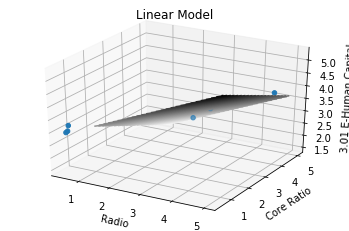

Radio Core Ratio 3.05 E-Culture & Incentives
Regression Score: 0.8592165423926489 p-value: [[0.01124003 0.02239418]]
Regression Coefficients: [ 0.73940565 -0.6149763 ] Intercept: 2.86765007898212


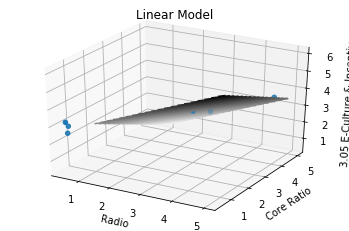

Radio Central Point Dominance 3.01 E-Human Capital
Regression Score: 0.9094230541031643 p-value: [[0.00608684 0.01865677]]
Regression Coefficients: [ 0.54401771 -0.40344786] Intercept: 2.9559675754929713


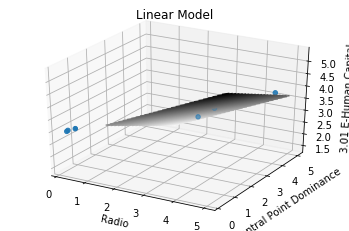

Radio Central Point Dominance 3.05 E-Culture & Incentives
Regression Score: 0.823966640718566 p-value: [[0.01741652 0.03810128]]
Regression Coefficients: [ 0.70862398 -0.56749746] Intercept: 2.806062660462471


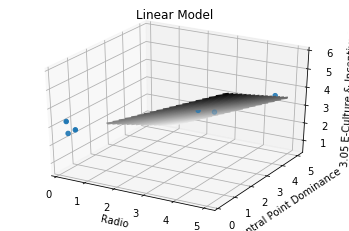

Radio Spectral radius 3.01 E-Human Capital
Regression Score: 0.9367898504494999 p-value: [[0.00339062 0.02812796]]
Regression Coefficients: [ 0.54770186 -0.30189855] Intercept: 2.5755631858183206


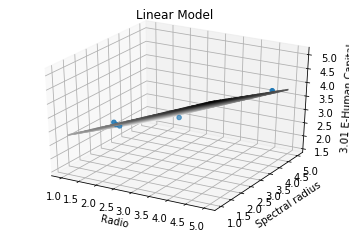

Radio Spectral radius 3.05 E-Culture & Incentives
Regression Score: 0.873629367921853 p-value: [[0.00906352 0.03117822]]
Regression Coefficients: [ 0.74649284 -0.52317306] Intercept: 2.4983573074879644


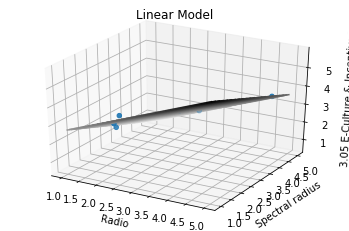

Camino más corto promedio Degree 2.03 I-Infrastructure
Regression Score: 0.8434757746449724 p-value: [[0.00447211 0.02243361]]
Regression Coefficients: [0.23247741 0.11902332] Intercept: 2.138117484614072


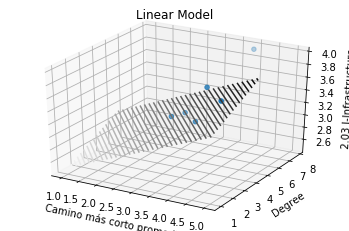

Camino más corto promedio Degree 3.03 E-Infrastructure
Regression Score: 0.9266096510507957 p-value: [[0.00181191 0.00435506]]
Regression Coefficients: [0.18641599 0.12029112] Intercept: 2.6486270388535114


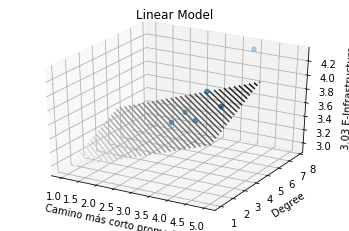

Camino más corto promedio Eccentricidad 2.05 I-Culture & Incentives
Regression Score: 0.9123469379428362 p-value: [[0.00214909 0.00394578]]
Regression Coefficients: [ 1.91191137 -1.51279181] Intercept: 1.0466003459133444


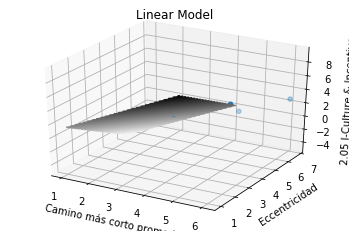

Camino más corto promedio Diámetro 3.04 E-Demand
Regression Score: 0.9166239433342187 p-value: [[0.00281746 0.00225223]]
Regression Coefficients: [ 0.58153703 -0.58478917] Intercept: 3.426787525881531


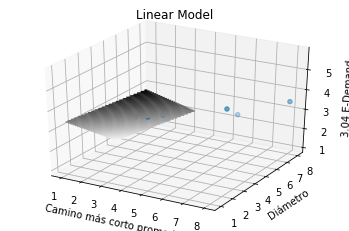

Camino más corto promedio Rich Club Coefficient 2.01 I-Human Capital
Regression Score: 0.8247477850911539 p-value: [[0.04396652 0.01293748]]
Regression Coefficients: [-0.03756129  0.02319812] Intercept: 2.3397348547546764


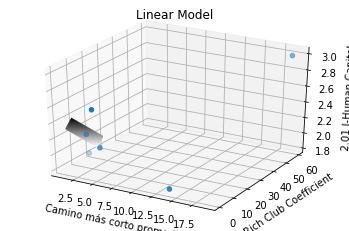

Transitividad Clustering 2.04 I-Demand
Regression Score: 0.9268942665982967 p-value: [[0.00060396 0.00283218]]
Regression Coefficients: [-4.48978212  2.43730157] Intercept: 3.092410788331625


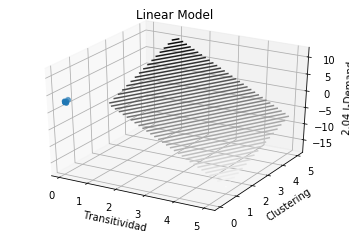

Transitividad Small Worldness 2.04 I-Demand
Regression Score: 0.8388186544897704 p-value: [[0.00972403 0.01156219]]
Regression Coefficients: [-0.98390208  0.8637008 ] Intercept: 2.9197250421529626


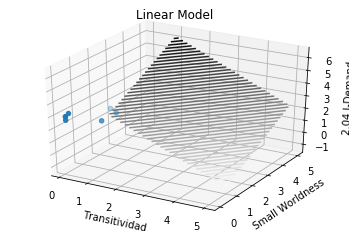

Transitividad Small Worldness 2.05 I-Culture & Incentives
Regression Score: 0.9996648693094287 p-value: [[1.09808720e-07 4.99565633e-08]]
Regression Coefficients: [-3.56729543  4.00941158] Intercept: 1.9605222987927948


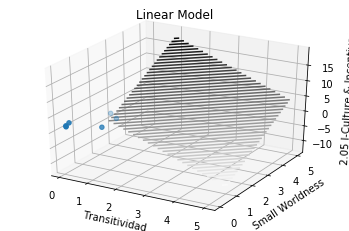

Transitividad Core Ratio 2.04 I-Demand
Regression Score: 0.8833301883900744 p-value: [[0.00513771 0.00614268]]
Regression Coefficients: [-2.30440631  2.0674474 ] Intercept: 2.9139744596207953


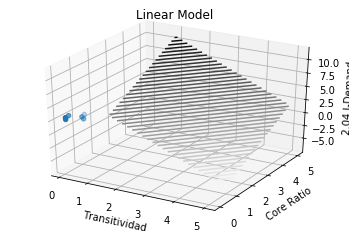

Eficiencia Global avg strength 2.05 I-Culture & Incentives
Regression Score: 0.8173595574715609 p-value: [[0.01554852 0.01750136]]
Regression Coefficients: [ 5.51139508 -5.34349845] Intercept: 1.9600853872464135


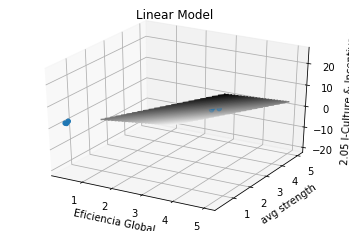

Eficiencia Global Clustering 2.04 I-Demand
Regression Score: 0.8610110346553704 p-value: [[0.01654117 0.00797756]]
Regression Coefficients: [-3.00064831  3.77316693] Intercept: 2.7297797812534257


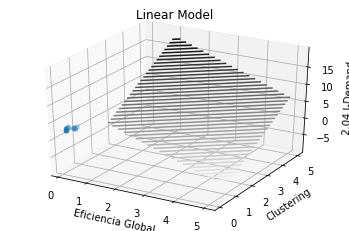

Eficiencia Global Clustering 2.05 I-Culture & Incentives
Regression Score: 0.9894705102839328 p-value: [[3.54584486e-05 5.12828622e-05]]
Regression Coefficients: [-18.04275933  16.70796565] Intercept: 2.741870582475795


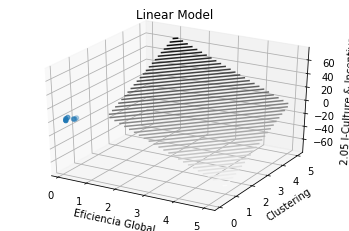

Eficiencia Global Diámetro 3.04 E-Demand
Regression Score: 0.8534634104877435 p-value: [[0.00881453 0.00851309]]
Regression Coefficients: [ 0.66237832 -0.63925197] Intercept: 3.25040170768711


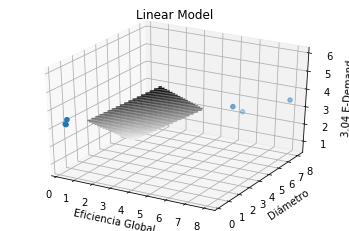

Eficiencia Global Transitividad 2.05 I-Culture & Incentives
Regression Score: 0.9162572755232081 p-value: [[0.00269346 0.00292846]]
Regression Coefficients: [-13.46741688  13.01462921] Intercept: 2.3987577709950774


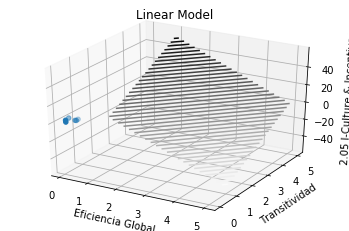

Eficiencia Global Small Worldness 2.05 I-Culture & Incentives
Regression Score: 0.9699603697385217 p-value: [[0.00077145 0.00040476]]
Regression Coefficients: [-3.6844818   4.07029861] Intercept: 2.017785790915267


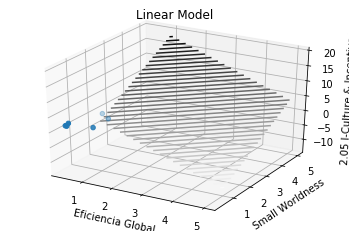

Eficiencia Global Core Ratio 2.05 I-Culture & Incentives
Regression Score: 0.8867604675972469 p-value: [[0.00661965 0.00506441]]
Regression Coefficients: [-10.92803991  11.60044021] Intercept: 2.0882126615403043


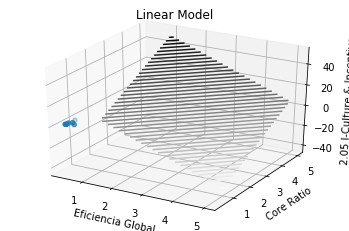

Eficiencia Global Central Point Dominance 3.03 E-Infrastructure
Regression Score: 0.8529018528387778 p-value: [[0.01630904 0.00438809]]
Regression Coefficients: [ 1.26367249 -2.35739063] Intercept: 4.067569450482249


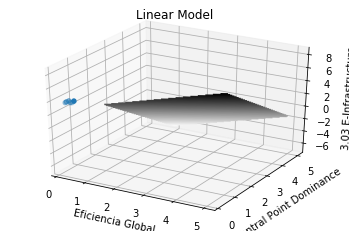

Rich Club Coefficient avg strength 3.01 E-Human Capital
Regression Score: 0.9278570238878204 p-value: [[0.00039039 0.00238253]]
Regression Coefficients: [ 0.09719978 -0.02543566] Intercept: 2.7748130487928386


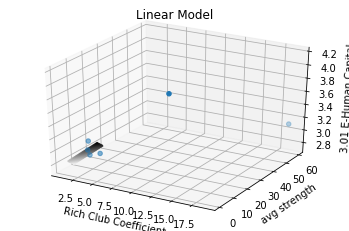

Rich Club Coefficient weight 3.01 E-Human Capital
Regression Score: 0.8725112043893428 p-value: [[0.0024403  0.00945553]]
Regression Coefficients: [ 0.0824678  -0.02334219] Intercept: 2.9313864062534205


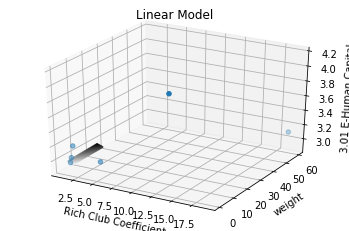

Rich Club Coefficient Degree 3.01 E-Human Capital
Regression Score: 0.8985810030093102 p-value: [[0.00072051 0.00477673]]
Regression Coefficients: [ 0.09763875 -0.02489379] Intercept: 2.7524390489551847


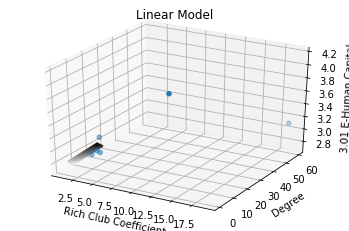

Rich Club Coefficient Eccentricidad 3.01 E-Human Capital
Regression Score: 0.9497674690928951 p-value: [[9.66196480e-05 8.99419581e-04]]
Regression Coefficients: [ 0.11101249 -0.02712826] Intercept: 2.607282795346749


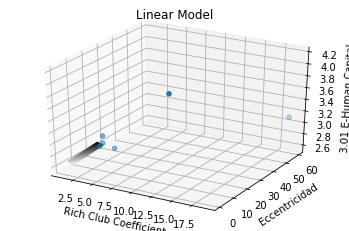

Rich Club Coefficient Eccentricidad 3.05 E-Culture & Incentives
Regression Score: 0.8421826559768368 p-value: [[0.00103418 0.01895877]]
Regression Coefficients: [ 0.13570723 -0.0262159 ] Intercept: 2.232713397498268


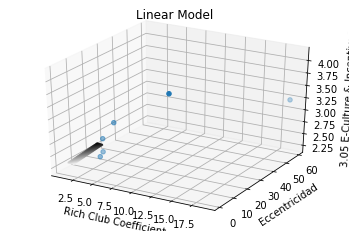

Rich Club Coefficient Clustering 3.01 E-Human Capital
Regression Score: 0.8544618286396557 p-value: [[0.00424346 0.01328386]]
Regression Coefficients: [ 0.076256  -0.0226271] Intercept: 2.998451457142743


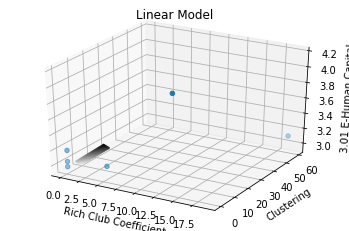

Rich Club Coefficient Diámetro 3.01 E-Human Capital
Regression Score: 0.9137765658108573 p-value: [[0.00018648 0.00224844]]
Regression Coefficients: [ 0.11816269 -0.02759638] Intercept: 2.4875132461853497


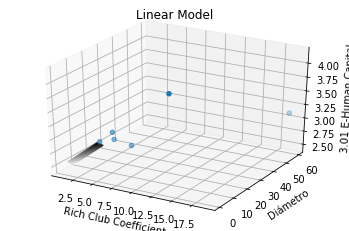

Rich Club Coefficient Diámetro 3.05 E-Culture & Incentives
Regression Score: 0.924818114331065 p-value: [[0.00012302 0.0036199 ]]
Regression Coefficients: [ 0.15539848 -0.02871891] Intercept: 2.001395442697402


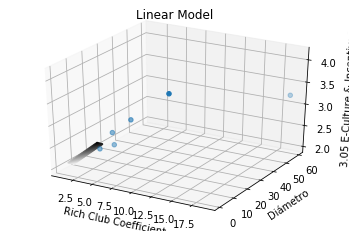

Rich Club Coefficient Radio 3.01 E-Human Capital
Regression Score: 0.8801909198638541 p-value: [[0.00109064 0.00649673]]
Regression Coefficients: [ 0.09500576 -0.02480641] Intercept: 2.775685147125593


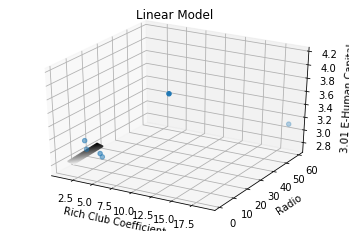

Rich Club Coefficient Camino más corto promedio 3.01 E-Human Capital
Regression Score: 0.9226150584250875 p-value: [[0.00046157 0.00276423]]
Regression Coefficients: [ 0.09659689 -0.02535723] Intercept: 2.780360469783632


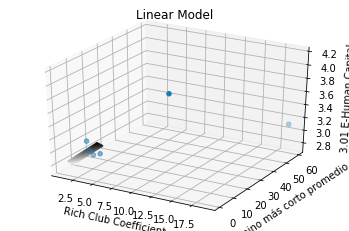

Rich Club Coefficient Transitividad 3.01 E-Human Capital
Regression Score: 0.8532791372538879 p-value: [[0.00435734 0.01354602]]
Regression Coefficients: [ 0.07601381 -0.0225883 ] Intercept: 3.0008252295824933


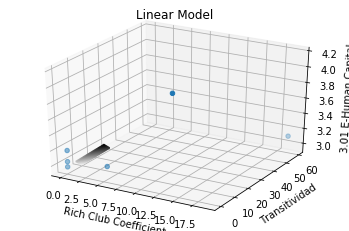

Rich Club Coefficient Eficiencia Global 3.01 E-Human Capital
Regression Score: 0.8590975740417901 p-value: [[0.003802   0.01229237]]
Regression Coefficients: [ 0.07729647 -0.02277555] Intercept: 2.9880012781956324


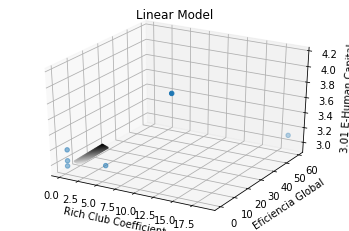

Rich Club Coefficient Small Worldness 3.01 E-Human Capital
Regression Score: 0.8679996414530673 p-value: [[0.00284636 0.01027956]]
Regression Coefficients: [ 0.08069191 -0.02320039] Intercept: 2.9512755333701057


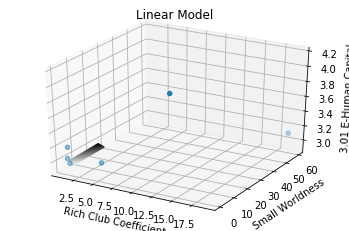

Rich Club Coefficient Core Ratio 3.01 E-Human Capital
Regression Score: 0.8603009577364396 p-value: [[0.00363347 0.01198373]]
Regression Coefficients: [ 0.07789719 -0.02284531] Intercept: 2.981382300823723


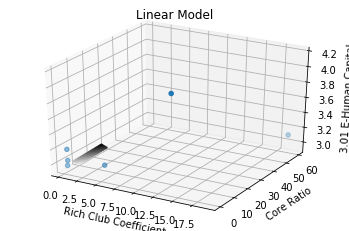

Rich Club Coefficient Central Point Dominance 3.01 E-Human Capital
Regression Score: 0.8657870284297157 p-value: [[0.00339811 0.01112203]]
Regression Coefficients: [ 0.07775695 -0.02288274] Intercept: 2.984943130971327


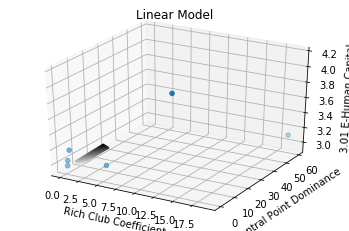

Rich Club Coefficient Spectral radius 3.01 E-Human Capital
Regression Score: 0.8942780745639922 p-value: [[0.00139696 0.0060702 ]]
Regression Coefficients: [ 0.08656358 -0.02404614] Intercept: 2.891400278498592


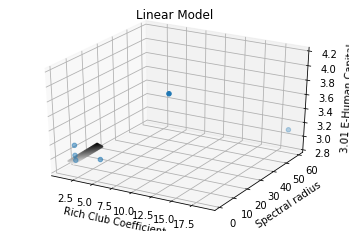

Core Ratio Clustering 2.04 I-Demand
Regression Score: 0.8360112520993394 p-value: [[0.01684346 0.01095576]]
Regression Coefficients: [-2.10929716  2.2931189 ] Intercept: 2.810576079390134


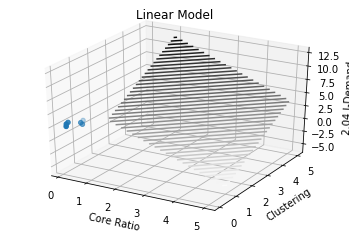

Core Ratio Transitividad 2.04 I-Demand
Regression Score: 0.8326639121613373 p-value: [[0.02071516 0.01085751]]
Regression Coefficients: [-1.84125601  2.10562459] Intercept: 2.774955191157563


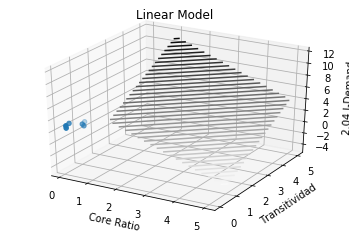

Core Ratio Small Worldness 2.04 I-Demand
Regression Score: 0.8631384856880238 p-value: [[0.00511386 0.00872316]]
Regression Coefficients: [-1.06256059  0.85245262] Intercept: 3.010128471975488


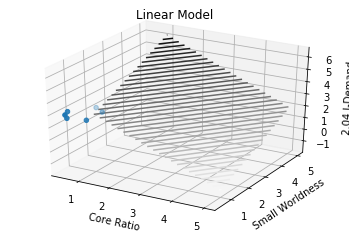

Core Ratio Small Worldness 2.05 I-Culture & Incentives
Regression Score: 0.9990863151335958 p-value: [[1.00015535e-06 3.60879175e-07]]
Regression Coefficients: [-3.3139235  3.9863931] Intercept: 1.7277082601669935


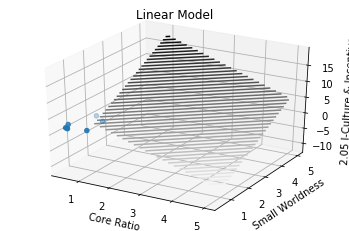

Central Point Dominance weight 3.03 E-Infrastructure
Regression Score: 0.8074717086728822 p-value: [[0.03653312 0.01762615]]
Regression Coefficients: [-0.40717174  0.3928563 ] Intercept: 3.832644292501125


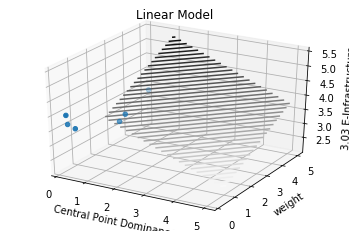

Central Point Dominance Eccentricidad 2.05 I-Culture & Incentives
Regression Score: 0.8801269873919346 p-value: [[0.00505823 0.00689314]]
Regression Coefficients: [ 1.84557242 -1.59154246] Intercept: 1.7852016878134243


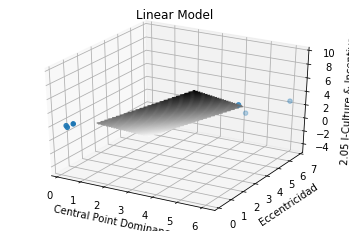

Central Point Dominance Diámetro 3.04 E-Demand
Regression Score: 0.985252820699359 p-value: [[7.69758450e-05 7.85456367e-05]]
Regression Coefficients: [ 0.67088027 -0.63827648] Intercept: 3.185268439387885


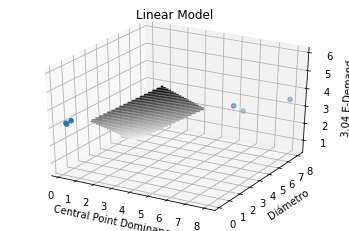

Central Point Dominance Radio 3.04 E-Demand
Regression Score: 0.8534606172350157 p-value: [[0.00923978 0.00837939]]
Regression Coefficients: [ 0.36841623 -0.38904743] Intercept: 3.2481158329799076


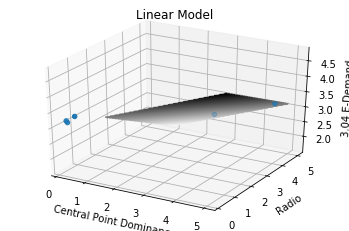

Spectral radius avg strength 2.04 I-Demand
Regression Score: 0.8029173026961494 p-value: [[0.01946897 0.01626518]]
Regression Coefficients: [ 1.15733119 -1.22646416] Intercept: 3.0572078411111643


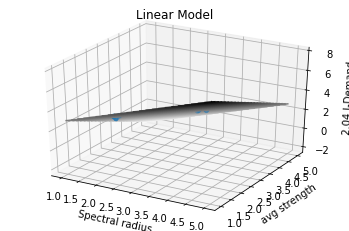

Spectral radius avg strength 2.05 I-Culture & Incentives
Regression Score: 0.9438484158432724 p-value: [[0.00130849 0.00162798]]
Regression Coefficients: [ 5.63350425 -5.33654317] Intercept: 1.5185422958482646


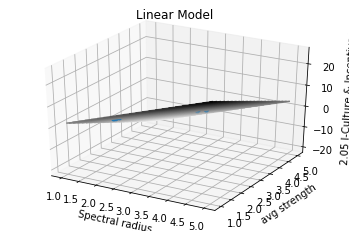

Spectral radius avg strength 3.04 E-Demand
Regression Score: 0.8790364502002165 p-value: [[0.00641038 0.00567872]]
Regression Coefficients: [ 1.59003289 -1.65037711] Intercept: 3.3745117402637894


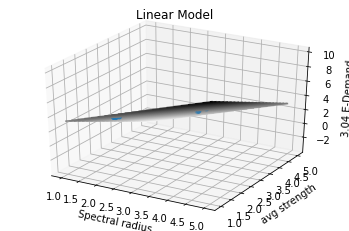

Spectral radius Eccentricidad 2.05 I-Culture & Incentives
Regression Score: 0.8868825074415476 p-value: [[0.00392832 0.00621678]]
Regression Coefficients: [ 1.98766226 -1.65468711] Intercept: 1.399653222862392


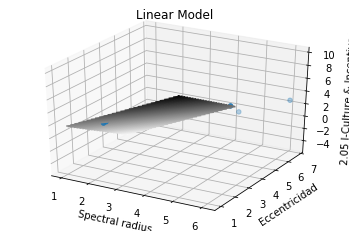

Spectral radius Diámetro 3.04 E-Demand
Regression Score: 0.9626786624969257 p-value: [[0.00052231 0.00052648]]
Regression Coefficients: [ 0.69543773 -0.66518981] Intercept: 3.2098045790479093


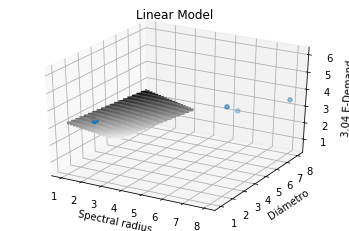

Spectral radius Radio 3.04 E-Demand
Regression Score: 0.8653066169843441 p-value: [[0.00869181 0.00477572]]
Regression Coefficients: [ 0.36881196 -0.44457638] Intercept: 3.4392478338019057


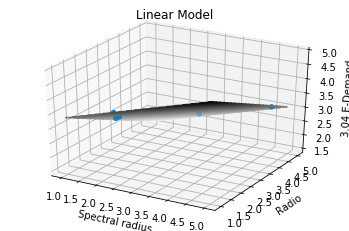

Spectral radius Rich Club Coefficient 2.01 I-Human Capital
Regression Score: 0.8269086802561233 p-value: [[0.04836997 0.01301732]]
Regression Coefficients: [-0.03693087  0.023156  ] Intercept: 2.327701668040489


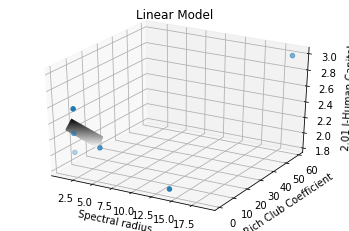

In [7]:

'''
3D linear models for predicting iEcosystem metrics using grph metrics
'''

grf_key_list=list(grf_df.keys())
grf_key_list.remove('Ciudad')
grf_key_list.remove('País')

ieco_key_list=list(ieco_df.keys())
ieco_key_list.remove('Unnamed: 0')

for key1 in grf_key_list:
    for key2 in grf_key_list:
        if key1 != key2:
            for predict in ieco_key_list:
                X=np.concatenate([ieco_grf_df[key1].to_numpy(),ieco_grf_df[key2].to_numpy()],axis=0)
                X=X.reshape(6,2)
                y=ieco_grf_df[predict].to_numpy()
                reg=LinearRegression().fit(X,y)
                p=lin_reg_p_val(reg,X,y)
                if p[0][0]<.05 and p[0][1]<.05 and reg.score(X,y)>.8:
                    print(key1,key2,predict)
                    print('Regression Score: ' + str(reg.score(X,y)) + ' p-value: ' + str(p) )
                    print('Regression Coefficients: ' + str(reg.coef_) + ' Intercept: ' + str(reg.intercept_))
                    plot_linear_model(reg,X,y,key1,key2,predict)